# Vocal separation

This notebook demonstrates a simple, but effective technique for separating vocals (and other sporadic foreground signals) from accompanying instrumentation.

Based on the method of [Rafii and Pardo, 2012](http://www.cs.northwestern.edu/~zra446/doc/Rafii-Pardo%20-%20Music-Voice%20Separation%20using%20the%20Similarity%20Matrix%20-%20ISMIR%202012.pdf), but includes a couple of modifications and extensions:

- fft windows are 1/4 overlap, instead of 1/2
- non-local filtering is converted into a soft mask by Wiener filtering.  This is similar in spirit to the soft-masking method used by [Fitzgerald, 2012](http://arrow.dit.ie/cgi/viewcontent.cgi?article=1086&context=argcon), but is a bit more numerically stable in practice.

In [1]:
from __future__ import print_function

In [2]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import Audio

Vendor:  Continuum Analytics, Inc.
Package: mkl
Message: trial mode expires in 29 days


In [3]:
# Load an example with vocals
y, sr = librosa.load('audio/Karissa_Hobbs_-_09_-_Lets_Go_Fishin.mp3', duration=90, offset=20)

In [4]:
S_full, phase = librosa.magphase(librosa.stft(y))

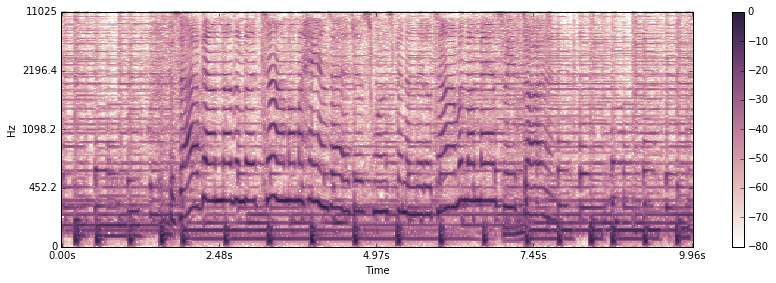

In [5]:
# Plot a ten-second
idx = slice(*librosa.time_to_frames([0, 10], sr=sr))
plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.logamplitude(S_full[:, idx]**2,
                                              ref_power=np.max), y_axis='log', x_axis='time')
plt.colorbar()
plt.tight_layout()

#### The wiggly lines above are due to the vocal component.  We can separate them by using non-local median filtering.

In [6]:
# We'll compare frames using cosine similarity
S_filter = librosa.decompose.nn_filter(S_full, aggregate=np.median, metric='cosine')

# The output of the filter shouldn't be greater than the input if we assume signals are additive
S_filter = np.minimum(S_full, S_filter)

In [7]:
# This is still a little too noisy, but we can fix it by soft-masking.
# The same trick is used in HPSS.
# We add 1e-8 here to avoid underflow for quiet frames
power = 2.0
mask = S_filter**power / (S_filter ** power + (S_full - S_filter)**power + 1e-8)

# Using the masks we get a cleaner signal
S_background = mask * S_full
S_foreground = (1 - mask) * S_full

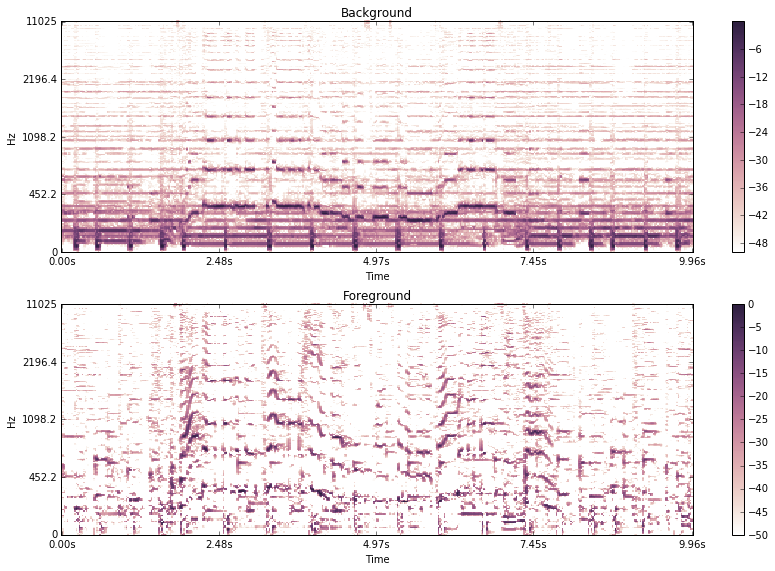

In [8]:
# Plot the same slice, but separated into its foreground and background

plt.figure(figsize=(12, 8))
plt.subplot(2,1,1)
librosa.display.specshow(librosa.logamplitude(S_background[:, idx]**2,
                                              ref_power=np.max, top_db=50), y_axis='log', x_axis='time')
plt.title('Background')
plt.colorbar()
plt.subplot(2,1,2)
librosa.display.specshow(librosa.logamplitude(S_foreground[:, idx]**2,
                                              ref_power=np.max, top_db=50), y_axis='log', x_axis='time')
plt.title('Foreground')
plt.colorbar()
plt.tight_layout()

#### And play them back in order: full, background, foreground (vocals)

In [9]:
Audio(data=y, rate=sr)

In [10]:
Audio(data=librosa.istft(S_background * phase), rate=sr)

In [11]:
Audio(data=librosa.istft(S_foreground * phase), rate=sr)